# Notebook configuration

# Dorothea cut analysis

In [1]:
import glob
import os
import functools
import itertools
import time
print("Running on ", time.asctime())

import numpy             as np
import tables            as tb
import matplotlib.pyplot as plt

import invisible_cities.reco.pmaps_functions  as pmapsf
import invisible_cities.filters.s1s2_filter as s1s2filt
import invisible_cities.database.load_db as dbf
import invisible_cities.reco.xy_algorithms as xyf
import invisible_cities.reco.corrections    as corrf
import invisible_cities.core.core_functions as coref
import invisible_cities.core.fit_functions  as fitf
import invisible_cities.reco.dst_functions as dstf
import invisible_cities.io.kdst_io as kdstio
import invisible_cities.io.dst_io as dstio

from invisible_cities.icaro.hst_functions import hist
from invisible_cities.icaro.hst_functions import hist2d
from invisible_cities.icaro.hst_functions import hist2d_profile
from invisible_cities.icaro.hst_functions import labels
from invisible_cities.icaro.hst_functions import poisson_sigma
from invisible_cities.icaro.hst_functions import gausstext
from invisible_cities.icaro.hst_functions import resolution
from invisible_cities.icaro.hst_functions import measurement_string

from invisible_cities.reco.tbl_functions     import get_event_numbers_and_timestamps_from_file_name
from invisible_cities.core.system_of_units_c import units

import lmfit.models as lmf

Running on  Fri Oct  6 15:26:31 2017


#### General plotting options

In [2]:
%matplotlib inline

np.warnings.filterwarnings('ignore')

plt.rcParams["figure.figsize"]          = 8, 6
plt.rcParams["font.size"]               = 15
plt.rcParams["figure.max_open_warning"] = 100

profOpt = "--k"
fitOpt  = "r"

#### General plots

In [3]:
def plot_var(s2ec, s2ea, x, y, r, z, sipmC, nsipm):    

    hist(s2ec, 100, [np.min(s2ec), np.max(s2ec)], weights = 1/nsipm);
    labels("pes", "Entries", "S2 cathode energy")
    plt.ticklabel_format(style="sci", axis='x', scilimits=[0,0])

    hist(s2ea, 100, [np.min(s2ea), np.max(s2ea)], weights = 1/nsipm);
    labels("pes", "Entries", "S2 anode energy")
    plt.ticklabel_format(style="sci", axis='x', scilimits=[0,0])
    
    hist(x, 100 , [-200., 200.], weights = 1/nsipm)
    labels("X (mm)", "Entries", "X distribution")
    
    hist(y, 100 , [-200., 200.], weights = 1/nsipm)
    labels("Y (mm)", "Entries", "Y distribution")
    
    hist(z, 600, [0., 600.], weights = 1/nsipm)
    labels("Z (mm)", "Entries", "Z distribution")
    
    hist(r, 200, [0., 200.], weights = 1/nsipm)
    labels("R (mm)", "Entries", "R distribution")
    
    hist(sipmC, 200, [np.min(sipmC),np.max(sipmC)])
    labels("SiPM charge (pes)", "Entries", "SiPM Charge distribution")
    
    hist(nsipm, np.max(nsipm) - np.min(nsipm), [np.min(nsipm), np.max(nsipm)], weights = 1/nsipm)
    labels("Number of SiPMs", "Entries", "Number of SiPMs touched per event")
    
    hist2d(x, y, 50, [[-200., 200.],[-200.,200.]], weights = 1/nsipm)
    labels("X (mm)", "Y (mm)", "XY distribution")

    #### General plots
    hist2d(r, s2ec, 50, [[0.,200.], [np.min(s2ec), np.max(s2ec)]], weights = 1/nsipm)
    labels("R (mm)", "Cathode energy", "S2 Cathode vs R")
    
    hist2d(r, s2ea, 50, [[0.,200.], [np.min(s2ea), np.max(s2ea)]], weights = 1/nsipm)
    labels("R (mm)", "Anode energy", "S2 Anode vs R")
    
    hist2d(z, s2ec, 50, [[0.,600.], [np.min(s2ec), np.max(s2ec)]], weights = 1/nsipm)
    labels("Z (mm)", "Cathode energy", "S2 Cathode vs Z")
    
    hist2d(z, s2ea, 50, [[0.,600.], [np.min(s2ea), np.max(s2ea)]], weights = 1/nsipm)
    labels("Z (mm)", "Anode energy", "S2 Anode vs Z")

#### Function to calculate lifetime

In [4]:
def lifetime_calculation(z, zrange, energy, erange, elim_min, elim_max, slope_min, slope_max, axes):
    axes[0].hist(energy, 50, erange)
    labels("S2 energy (pes)", "Entries", "Fidualized energy spectrum")

    low_cut   = elim_min * np.exp(-slope_min*z)
    high_cut  = elim_max * np.exp(-slope_max*z)
    sel       = coref.in_range(energy, low_cut, high_cut) # remove low and high E background

    axes[1].hist2d(z, energy, (100, 50), range=(zrange, erange))
    x, y, u_y = fitf.profileX(z[sel], energy[sel], 100, xrange=zrange, yrange=erange)

    axes[1].plot(x, y, profOpt)
    axes[1].plot(z,  low_cut, "k.")
    axes[1].plot(z, high_cut, "k.")

    Zrange_LT = zrange
    
    seed = np.max(y), (x[15] - x[5])/np.log(y[15]/y[5])
    f    = fitf.fit(fitf.expo, x, y, seed, fit_range=Zrange_LT, sigma=u_y)

    axes[1].plot(x, f.fn(x), fitOpt, lw=4)
    print("Energy at z=0 = {:.1f} +- {:.1f}".format( f.values[0], f.errors[0]))
    print("Lifetime      = {:.1f} +- {:.1f}".format(-f.values[1], f.errors[1]))
    print("Chi2          = {:.2f}          \n".format(f.chi2))

    axes[1].text(zrange[0] + 0.1*(zrange[1]-zrange[0]), erange[0] + 1000, \
                "Lifetime = {:.1f} +- {:.1f}".format(-f.values[1], f.errors[1]), color = "white", fontsize = 30)
    
    labels("Drift time ($\mu$s)", "S2 energy (pes)", "Fiducialized energy spectrum vs Z")

    return np.array([-f.values[1], f.errors[1]]), corrf.LifetimeCorrection(-f.values[1], f.errors[1])

#### Basic fit functions

In [5]:
def sqrt(z,diff,c):
#    dv = 0.967581242621
#    return c**2+(2*diff*z)/(dv**2)
    return np.sqrt(c+diff*z)
def lin(z, diff,c):
    return c+diff*z

#### Diffusion fit functions

In [6]:
def transDiffusionFit(sigmaAll, zrange, step, dv = 1., dv_e = 0.):
    sigmaX = np.array([item[0] for item in sigmaAll[:]])
    sigmaY = np.array([item[1] for item in sigmaAll[:]])
    
    z_scan_diff = np.arange(zrange[0]+step/2., zrange[1]+step/2.,step)
    fig1 = plt.figure()
    ax1 = fig1.add_subplot(111)
    ax1.scatter(z_scan_diff, sigmaX, label="$\sigma_x$")
    ax1.scatter(z_scan_diff, sigmaY, color='black', label="$\sigma_y$")
    ax1.set_xlabel("Drift time ($\mu$s)")
    ax1.set_ylabel("Sigma (mm)")
    fig1.suptitle("Run {0} (drift field = {1:.0f} V/cm) Transverse diffusion".format(run,drift_fields[run], fontsize = 30))
    
    seed = 0.3,0.1

    dx, cx = diffFit(sigmaX, z_scan_diff, seed, dv, dv_e, ax1)
    dy, cy = diffFit(sigmaY, z_scan_diff, seed, dv, dv_e, ax1, color = "g")

    ax1.legend(fontsize=12)

    diff = []
    const = []
    
    diff.append(dx)
    diff.append(dy)
    
    const.append(cx)
    const.append(cy)
    
    return np.array(diff), np.array(const)

In [7]:
def longDiffusionFit(sigmaAll, zrange, step, dv = 1., dv_e = 0.):    
    z_scan_diff = np.arange(zrange[0]+step/2., zrange[1]+step/2.,step)
    fig1 = plt.figure()
    ax1 = fig1.add_subplot(111)
    ax1.errorbar(z_scan_diff, sigmaAll[:,0], yerr=sigmaAll[:,1], label="$\sigma_z$", fmt='o')
    ax1.set_xlabel("Drift time ($\mu$s)")
    ax1.set_ylabel("Sigma Z ($\mu$s)")
    fig1.suptitle("Run {0} (drift field = {1:.0f} V/cm) Longitudinal diffusion".format(run,drift_fields[run], fontsize = 30))
    
    seed = 0.01,0.1

    f = fitf.fit(sqrt, z_scan_diff, sigmaAll[:,0], seed=seed, sigma = sigmaAll[:,1])
    ax1.plot(z_scan_diff, f.fn(z_scan_diff), fitOpt, label="[({:.4f} +- {:.4f})·x + \n ({:.4f} +- {:.4f})]".format(f.values[0], f.errors[0], f.values[1], f.errors[1])+r"$^{0.5}$")

    const = f.values[0]
    const_e = f.errors[0]    
    
    D = dv*dv*const/2*1000000/100
    D_e = (dv*dv*const_e/2 + const*dv*dv_e)*1000000/100
    
    c = np.sqrt(np.abs(f.values[1]))
    c_e = 0.5*np.abs(f.errors[1])/np.sqrt(np.abs(f.values[1]))
    
    print("Diffusion coefficient (cm^2/s^-1) = {:.4f} +- {:.4f}".format(D, D_e))
    print("Constant parameter (mm) = {:.4f} +- {:.4f}\n".format(c, c_e))

    ax1.legend(fontsize=12)    
    
    D = [D, D_e]
    C = [c, c_e]

    return np.array(D), np.array(C)

In [8]:
def diffFit(sigma, z_scan_diff, seed, dv, dv_e, ax, color = fitOpt):
    f = fitf.fit(sqrt, z_scan_diff, sigma, seed=seed)
    ax.plot(z_scan_diff, f.fn(z_scan_diff), color, label="[({:.4f} +- {:.4f})·x + \n ({:.4f} +- {:.4f})]".format(f.values[0], f.errors[0], f.values[1], f.errors[1])+r"$^{0.5}$")

    const = f.values[0]
    const_e = f.errors[0]    
    
    D = dv*dv*const/2*1000000/100
    D_e = (dv*dv*const_e/2 + const*dv*dv_e)*1000000/100
    
    c = np.sqrt(np.abs(f.values[1]))
    c_e = 0.5*np.abs(f.errors[1])/np.sqrt(np.abs(f.values[1]))
    
    print("Diffusion coefficient (cm^2/s^-1) = {:.4f} +- {:.4f}".format(D, D_e))
    print("Constant parameter (mm) = {:.4f} +- {:.4f}\n".format(c, c_e))
    
    D = [D, D_e]
    C = [c, c_e]

    return D, C

#### Function to calculate transversal dispersion from profile

In [9]:
def diff_calculation(xc, yc, Ec, Ece, axes, verbosity = False):
    xproj = [np.sum(Ec[:,i]) for i in range(len(Ec))]
    yproj = [np.sum(Ec[i,:]) for i in range(len(Ec))]
    xproj_e = [np.sum(Ece[:,i]) for i in range(len(Ece))]
    yproj_e = [np.sum(Ece[i,:]) for i in range(len(Ece))]
    
    axes[1].hist(xc, len(xc), [np.min(xc), np.max(xc)], weights = xproj)
    axes[1].set_xlabel("X (mm)")
    axes[1].set_ylabel("Mean charge")
    axes[1].set_title("Charge profile X projection")    

    voigt_mod = lmf.VoigtModel()
    const_mod = lmf.ConstantModel()

    pars = const_mod.make_params(independent_vars = xproj[0])
    pars += voigt_mod.guess(xproj, x=xc)
    
    mod = const_mod + voigt_mod
    fx  = mod.fit(xproj, pars, x=xc)

    axes[1].plot(xc, fx.best_fit, fitOpt, lw=4)

    if verbosity:
        print("X DIMENSION")
        print(fx.fit_report())

    axes[2].hist(yc, len(yc), [np.min(yc), np.max(yc)], weights = yproj)
    axes[2].set_xlabel("Y (mm)")
    axes[2].set_ylabel("Mean charge")
    axes[2].set_title("Charge profile Y projection")
    
    pars = const_mod.make_params(independent_vars = yproj[0])
    pars += voigt_mod.guess(yproj, x=yc)
    
    mod = const_mod + voigt_mod
    fy  = mod.fit(yproj, pars, x=yc)
    
    axes[2].plot(yc, fy.best_fit, fitOpt, lw=4)
    if verbosity:
        print("Y DIMENSION")
        print(fy.fit_report())

    return [np.abs(fx.best_values['sigma']), np.abs(fy.best_values['sigma'])], [fx.best_values['c'], fy.best_values['c']]
#return [np.abs(2*fx.best_values['sigma']*np.sqrt(2*np.log(2))), np.abs(2*fy.best_values['sigma']*np.sqrt(2*np.log(2)))], [fx.best_values['c'], fy.best_values['c']]

In [10]:
def transversalProfile(DataSiPM, mapDST, step = 25, z_int = 25, zrange = [0, 550]):
    plt.rcParams["font.size"]               = 10

    z_scan = np.arange(zrange[0], zrange[1], step)

    sipm_xyrange = (-30., 30.)

    DX = mapDST.X.values - DataSiPM.X.values[mapDST.SensorID.values]
    DY = mapDST.Y.values - DataSiPM.Y.values[mapDST.SensorID.values]
    E_Sipm = mapDST.SensorQ.values

    sigmaAll = []
    constantAll = []

    for i,z in enumerate(z_scan):
        sel = coref.in_range(mapDST.Z, z, z+z_int)
        sel = sel & coref.in_range(ZCorr(mapDST.Z).value*mapDST.EC, low_cut, high_cut) 
        sel = sel & (mapDST.NSiPM>=4)
        fig, axes = plt.subplots(1, 3, figsize=(24,6))
        plt.axes(axes[0])
        (xc, yc, Ec, Ece), _, cb = \
        hist2d_profile(DX[sel], DY[sel], E_Sipm[sel], 60, 60, sipm_xyrange, sipm_xyrange,  new_figure = False)
        cb.set_label("E (pes)")
        labels("x (mm)", "y (mm)", "Energy vs XY for Z = [{0},{1}]".format(z, z+z_int))
        sigma, constant = diff_calculation(xc,yc,Ec,Ece, axes, False)
        sigmaAll.append(sigma)
        constantAll.append(constant)

    return sigmaAll, constantAll

#### Function to calculate longitudinal dispersion from profile

In [11]:
def longitudinalProfile(mapDST, step = 25, z_int = 25, zrange = [0, 550]):
    plt.rcParams["font.size"]               = 10

    step = 25
    z_int = 25
    z_scan = np.arange(zrange[0], zrange[1], step)

    sigmaAll = []

    n_row = 4
    nrows = len(z_scan)//n_row

    if len(z_scan)%n_row>0:
        nrows +=1
        
    fig, axes = plt.subplots(nrows, n_row, figsize=(18, 4*nrows))
    st = fig.suptitle("Run {0} (drift field = {1:.0f} V/cm) ZXY profiles".format(run,drift_fields[run]), \
                      fontsize = 20)
    
    for i,z in enumerate(z_scan):
        sel = coref.in_range(mapDST.Z, z, z+z_int)
        sel = sel & coref.in_range(ZCorr(mapDST.Z).value*mapDST.EC, low_cut, high_cut) 
        x, y, u_y = fitf.profileX(mapDST.PosBin[sel], mapDST.SliceE[sel], 100, xrange=[0,20], yrange=[0,10000])
        axes[i//n_row][i%n_row].plot(x, y, profOpt)
    
        seed = np.max(y), x[np.argmax(y)], x.std()
        f    = fitf.fit(fitf.gauss, x, y, seed, fit_range=[0,x[2*np.argmax(y)]], sigma=u_y)

        x_plot = np.arange(0.,20.,0.1)
        axes[i//n_row][i%n_row].plot(x_plot, f.fn(x_plot), fitOpt)
        axes[i//n_row][i%n_row].set_xlabel("Time bin (#)")
        axes[i//n_row][i%n_row].set_ylabel("Bin energy (pes)")
        axes[i//n_row][i%n_row].set_title("Energy per slice for Z = [{0},{1}]".format(z, z+z_int))

        sigmaAll.append([f.values[2],f.errors[2]])

    fig.tight_layout() 
    st.set_y(0.98)
    fig.subplots_adjust(top=0.92)
    
    return np.array(sigmaAll)

#### Function to calculate longitudinal dispersion from events

In [12]:
def longitudinalEvent(mapDST, sigmaLim, diffLim, dv = 1., dv_e = 0., zrange = [0, 550]):
    plt.rcParams["font.size"]               = 10
        
    low_cut_sigma = -1.*sigmaLim + np.sqrt(diffLim*mapDST.Z)
    high_cut_sigma = 1.5*sigmaLim + np.sqrt(diffLim*mapDST.Z)

    sel = coref.in_range(mapDST.Z, zrange[0], zrange[1]) 
    sel = sel & coref.in_range(mapDST.SigmaZ, low_cut_sigma, high_cut_sigma)
    sel = sel & coref.in_range(ZCorr(mapDST.Z).value*mapDST.EC, low_cut, high_cut)     

    fig, axes = plt.subplots(1, 2, figsize=(16,6))
    st = fig.suptitle("Run {0} (drift field = {1:.0f} V/cm) Longitudinal diffusion event by event".format(run,drift_fields[run]), \
                      fontsize = 20)    
    plt.axes(axes[0])    
    hist(mapDST.SigmaZ[sel], 100, [0., 6.], new_figure=False)
    labels("Longitudinal RMS", "Entries", "Longitudinal width")

    plt.axes(axes[1])
    hist2d(mapDST.Z[sel], mapDST.SigmaZ[sel], 100, \
           [[zrange[0], zrange[1]],[0., mapDST.SigmaZ[sel].max()+1]], new_figure=False)
    labels("Z position ($\mu$s)", "Longitudinal RMS ($\mu$s)", "Longitudinal width variation")
    plt.plot(mapDST.Z,  low_cut_sigma, "k.", label='_nolegend_')
    plt.plot(mapDST.Z, high_cut_sigma, "k.", label='_nolegend_')

    seed = 0.008,0.25
    f = fitf.fit(sqrt, mapDST.Z[sel], mapDST.SigmaZ[sel], seed=seed)
    plt.plot(np.arange(zrange[0], zrange[1], 1), f.fn(np.arange(zrange[0], zrange[1], 1)), fitOpt, label="[({:.4f} +- {:.4f})·x + \n ({:.4f} +- {:.4f})]".format(f.values[0], f.errors[0], f.values[1], f.errors[1])+r"$^{0.5}$")
    plt.legend()

    const = f.values[0]
    const_e = f.errors[0] 
    
    D = dv*dv*const/2*1000000/100
    D_e = (dv*dv*const_e/2 + const*dv*dv_e)*1000000/100
    
    c = np.sqrt(np.abs(f.values[1]))
    c_e = 0.5*np.abs(f.errors[1])/np.sqrt(np.abs(f.values[1]))

    fig.tight_layout()    
    st.set_y(0.98)
    fig.subplots_adjust(top=0.85)
    
    print("Diffusion coefficient (cm^2/s^-1) = {:.4f} +- {:.4f}".format(D, D_e))
    print("Constant parameter (mm) = {:.4f} +- {:.4f}\n".format(c, c_e))    

    D = [D, D_e]
    C = [c, c_e]

    return D, C

## Standard functions and ranges for checks 

In [13]:
erange = 0, 13500
rrange =[0,200.]

In [14]:
def checkLifetime(mapDST, R, elim_min, elim_max, slope_min, slope_max, zrange, axes):
    sel = R<150.
    
    #Lifetime calculation
    return lifetime_calculation(mapDST.Z[sel], zrange, mapDST.EC[sel], erange, \
                                 elim_min, elim_max, slope_min, slope_max, axes)

In [15]:
def radialCuts(elim_min, elim_max, R, axes, fPlot = False):
    low_cut   = elim_min *(1/(1 + np.exp((R-205)/20)))
    high_cut  = elim_max *(1/(1 + np.exp((R-220)/20)))

    if fPlot:
        sel = (mapDST.Z<600.) & (mapDST.EC<20000.) & coref.in_range(ZCorr(mapDST.Z).value*mapDST.EC, low_cut, high_cut) # remove low and high E background

        axes[2].hist2d(R[sel], ZCorr(mapDST.Z[sel]).value*mapDST.EC[sel], (100, 50), range=(rrange, erange))
        labels("Radial position (mm)", "S2 energy (pes)","") #"Fiducialized energy spectrum vs R")

        x_prof, y_prof, u_y = fitf.profileX(R[sel], ZCorr(mapDST.Z[sel]).value*mapDST.EC[sel], 100, xrange=rrange)

        plt.plot(x_prof, y_prof, profOpt)
        plt.plot(R,  low_cut, "k.")
        plt.plot(R, high_cut, "k.")
    
    return low_cut, high_cut

# Run parameters

In [16]:
gate_voltage = 7
z_cathode = dbf.DetectorGeo().ZMAX[0]

run_numbers = [4670, 4660, 4661, 4663, 4664, 4665, 4666, 4667, 4668, 4669]
voltages = {4670: 28, 4660: 26, 4661: 24, 4663: 22, 4664: 20, 4665: 18, 4666: 16, 4667: 14, 4668: 13, 4669: 12}
drift_fields = {k: (v-gate_voltage)*10000./z_cathode for k, v in voltages.items()}

elimZ_min = {4660: 10100, 4661: 10000, 4663: 10000, 4664: 10000, 4665: 10000, \
             4666: 10000, 4667: 10000, 4668: 10000, 4669: 10000, 4670: 10000}
elimZ_max = {4660: 13500, 4661: 13500, 4663: 13500, 4664: 13500, 4665: 13500, \
             4666: 13500, 4667: 13500, 4668: 13500, 4669: 13500, 4670: 13500}

elimR_min = {4660: 10100, 4661: 10000, 4663: 9800, 4664: 9800, 4665: 9200, \
             4666: 9200, 4667: 9200, 4668: 9200, 4669: 9200, 4670: 10100}
elimR_max = {4660: 13500, 4661: 13500, 4663: 13500, 4664: 13500, 4665: 13500, \
             4666: 13500, 4667: 13500, 4668: 13500, 4669: 13500, 4670: 13500}

slope_min = {4660: 0.00065, 4661: 0.00070, 4663: 0.00075, 4664: 0.00080, 4665: 0.00085, \
             4666: 0.00105, 4667: 0.00135, 4668: 0.00145, 4669: 0.00175, 4670: 0.00065}
slope_max = {4660: 0.00065, 4661: 0.00070, 4663: 0.00075, 4664: 0.00080, 4665: 0.00085, \
             4666: 0.00105, 4667: 0.00135, 4668: 0.00145, 4669: 0.00175, 4670: 0.00065}

sigmaLim = {4660: 0.33, 4661: 0.35, 4663: 0.35, 4664: 0.35, 4665: 0.35, \
            4666: 0.72, 4667: 0.92, 4668: 1.07, 4669: 1.68, 4670: 0.35}

diffLim = {4660: 0.013, 4661: 0.014, 4663: 0.016, 4664: 0.019, 4665: 0.023, \
           4666: 0.033, 4667: 0.062, 4668: 0.09, 4669: 0.15, 4670: 0.011}

zrange = {4660: [25, 500], 4661: [25, 500], 4663: [25, 500], 4664: [25, 500], 4665: [25, 500], \
          4666: [25, 500], 4667: [25, 350], 4668: [25, 275], 4669: [25, 200], 4670: [25, 500]}


#Drift velocities from MagBoltz and data [run 4668 and 4669 cannot from data,  4668 not simulated in magboltz]
dv_mb = {4660: 0.9477, 4661: 0.9283, 4663: 0.9001, 4664: 0.8730, 4665: 0.8581, \
      4666: 0.8023, 4667: 0.7288, 4668: 0.6588, 4669: 0.5742, 4670: 0.967581242621}

dv_mb_e = {4660: 0.9477*0.0089, 4661: 0.9283*0.0114, 4663: 0.9001*0.0116, 4664: 0.8730*0.0105, 4665: 0.8581*0.0109, 
        4666: 0.8023*0.0141, 4667: 0.7288*0.0151, 4668: 0.6588*0.0151, 4669: 0.5742*0.0447, 4670: 6.45920352755e-05}

dv = dv_mb
dv_e = dv_mb_e

zrange_dv = {4660: [500, 600], 4661: [525, 625], 4663: [535, 635], 4664: [550, 650], 4665: [600, 645], \
             4666: [610, 710], 4667: [690, 790], 4668: [800, 1000], 4669: [900, 1200], 4670: [500, 600]}

bins_dv = {4660: 100, 4661: 100, 4663: 100, 4664: 100, 4665: 50, 4666: 50, \
           4667: 50, 4668: 100, 4669: 100, 4670: 100}

# Drift velocity

Max drift length = 549.136 +- 0.127
Drift velocity   = 0.96880 +- 0.00022
Max drift length = 558.864 +- 0.188
Drift velocity   = 0.95193 +- 0.00032
Max drift length = 569.623 +- 0.170
Drift velocity   = 0.93395 +- 0.00028
Max drift length = 581.907 +- 0.236
Drift velocity   = 0.91424 +- 0.00037
Max drift length = 598.178 +- 0.265
Drift velocity   = 0.88937 +- 0.00039
Max drift length = 620.630 +- 0.450
Drift velocity   = 0.85719 +- 0.00062
Max drift length = 659.552 +- 1.243
Drift velocity   = 0.80661 +- 0.00152
Max drift length = 748.500 +- 1.940
Drift velocity   = 0.71076 +- 0.00184


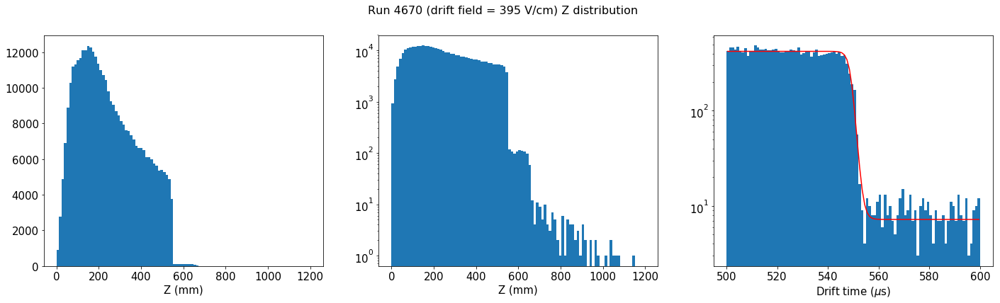

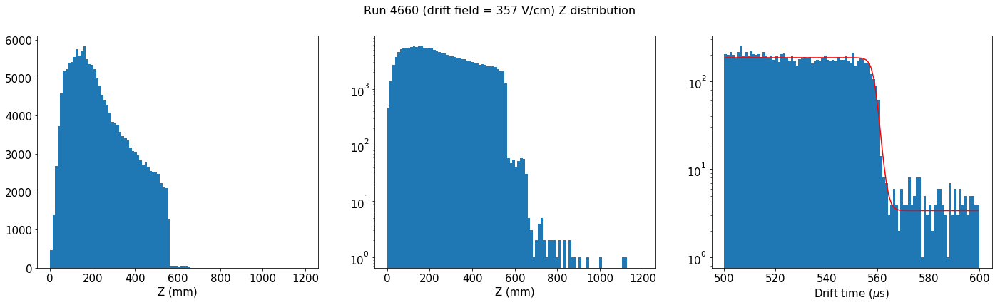

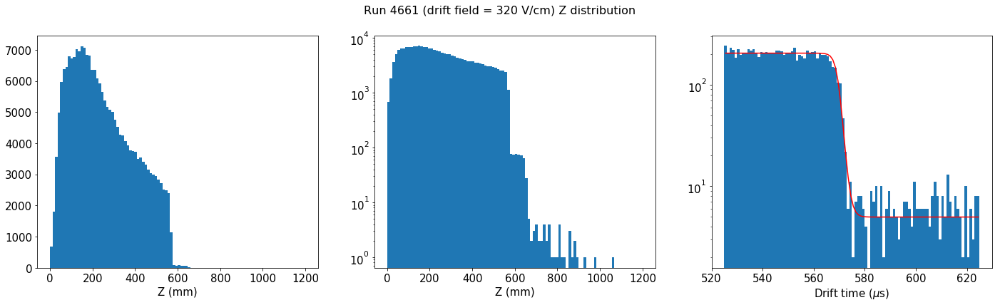

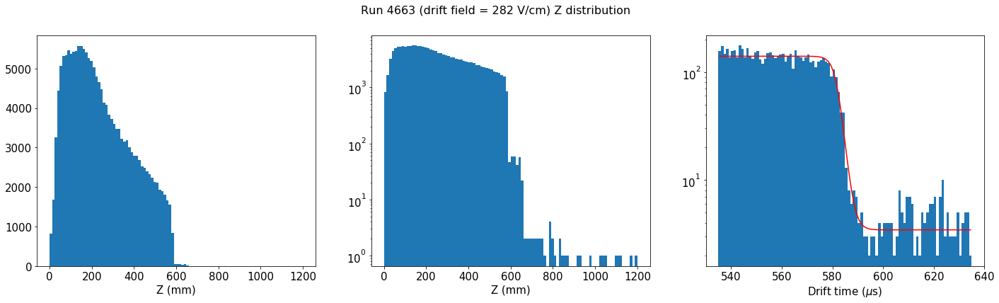

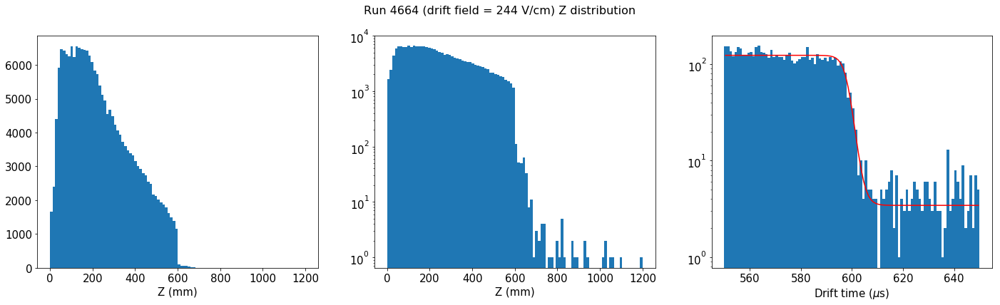

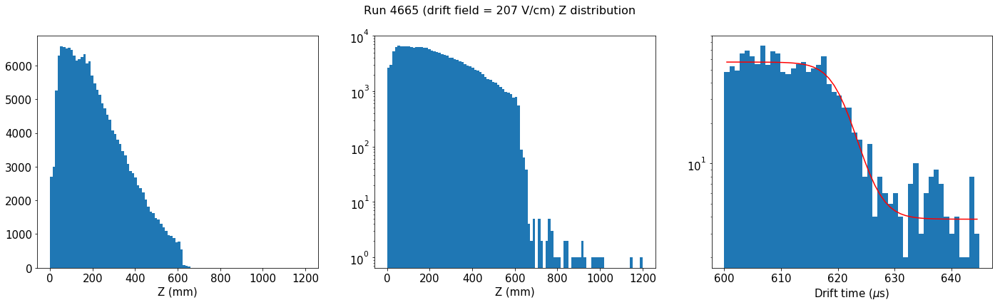

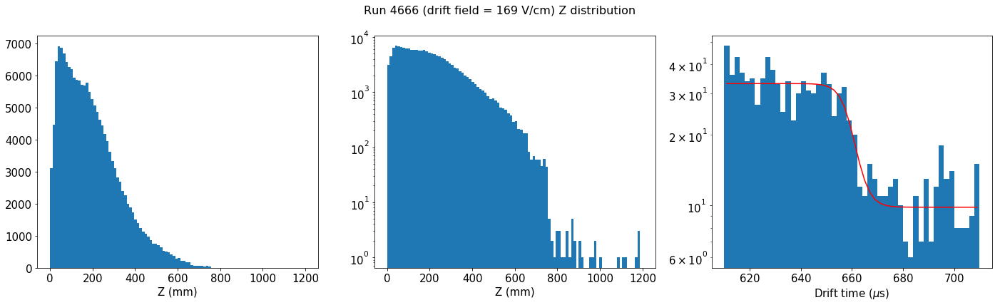

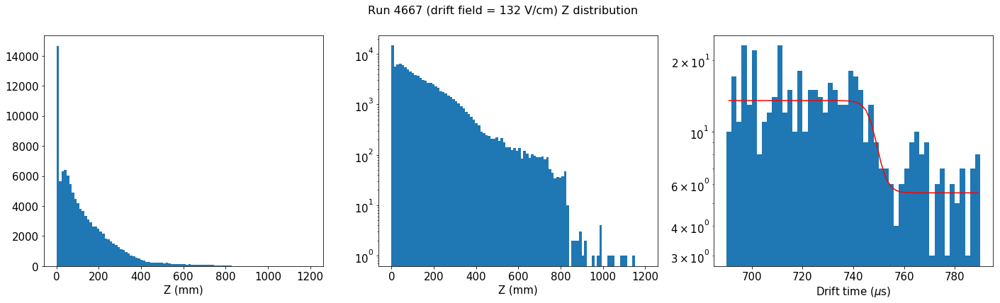

In [17]:
ph_dv = {}
ph_dv_e = {}

for run in run_numbers[:-2]:
    inputfiles = glob.glob("/Users/ansimez/Documents/InvCit/hdf5/{0}/sipm_dst/sipm_dst_SiPM_xyzDiff_{0}.h5".format(run)) 
    mapDST = dstio.load_dsts(inputfiles, "Sensor_DST", "SiPM Map")

    fig, axes = plt.subplots(1, 3, figsize=(24,6))
    st = fig.suptitle("Run {0} (drift field = {1:.0f} V/cm) Z distribution".format(run,drift_fields[run]), \
                      fontsize = 16)
    
    axes[0].hist(mapDST.Z, 100, [0, 1200])
    axes[0].set_xlabel("Z (mm)")
    axes[0].set_ylabel("")

    axes[1].hist(mapDST.Z, 100, [0, 1200])
    axes[1].set_xlabel("Z (mm)")
    axes[1].set_ylabel("")    
    axes[1].set_yscale('log')

    plt.axes(axes[2])
    y, x, _ = hist(mapDST.Z, bins_dv[run], [zrange_dv[run][0], zrange_dv[run][1]], new_figure = False)
    axes[2].set_xlabel("Z (mm)")
    axes[2].set_ylabel("")     
    axes[2].set_yscale('log')

    sigmoid  = lambda x, A, B, C, D: A/(1 + np.exp((x-B)/C)) + D
    seed     = np.max(y), np.mean(zrange_dv[run]), np.diff(zrange_dv[run])[0]/100, np.min(y)
    f        = fitf.fit(sigmoid, x, y, seed,
                        sigma     = poisson_sigma(y))

    dv[run] = z_cathode/f.values[1]
    dv_e[run] = dv[run]/f.values[1] * f.errors[1]
    
    ph_dv[run] = dv[run]
    ph_dv_e[run] = dv_e[run]
    
    plt.plot(x, f.fn(x), fitOpt)
    labels("Drift time ($\mu$s)", "", "")

    print("Max drift length = {:.3f} +- {:.3f}".format(f.values[1], f.errors[1]))
    print("Drift velocity   = {:.5f} +- {:.5f}".format(dv[run], dv_e[run]))

In [28]:
dv

{4660: 0.95193022393006321,
 4661: 0.93395137439040732,
 4663: 0.91423575607647678,
 4664: 0.88936761740781534,
 4665: 0.85719376896317967,
 4666: 0.80660805957139881,
 4667: 0.7107552911337679,
 4668: 0.6588,
 4669: 0.5742,
 4670: 0.96879504586130361}

In [30]:
dv_mb = {4660: 0.9477, 4661: 0.9283, 4663: 0.9001, 4664: 0.8730, 4665: 0.8581, \
      4666: 0.8023, 4667: 0.7288, 4668: 0.6588, 4669: 0.5742, 4670: 0.967581242621}

dv_mb_e = {4660: 0.9477*0.0089, 4661: 0.9283*0.0114, 4663: 0.9001*0.0116, 4664: 0.8730*0.0105, 4665: 0.8581*0.0109, 
        4666: 0.8023*0.0141, 4667: 0.7288*0.0151, 4668: 0.6588*0.0151, 4669: 0.5742*0.0447, 4670: 6.45920352755e-05}


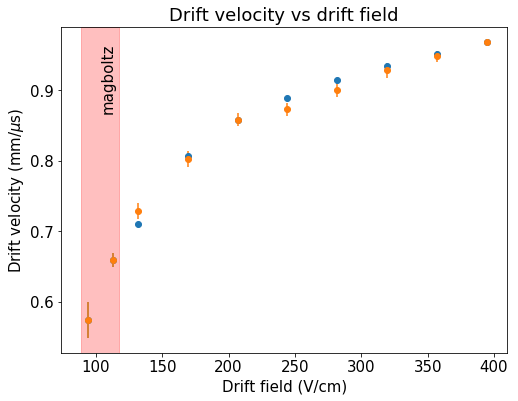

In [31]:
dvList = sorted(dv.items())
runList, dv_plot = zip(*dvList)
dv_eList = sorted(dv_e.items())
runList, dv_e_plot = zip(*dv_eList)

drift = [drift_fields[i] for i in runList]

fig = plt.figure()
ax1 = fig.add_subplot(111)
ax1.errorbar(drift, dv_plot, yerr=dv_e_plot, label="Drift velocity (data)", fmt='o')
ax1.errorbar(drift, list(dv_mb.values()), yerr=list(dv_mb_e.values()), label="Drift velocity (magboltz)", fmt='o')
ax1.set_xlabel("Drift field (V/cm)")
ax1.set_ylabel("Drift velocity (mm/$\mu$s)")
ax1.set_title("Drift velocity vs drift field")
#ax1.set_ylim(0.85, 0.87)
ax1.axvspan(drift_fields[4669]-5, drift_fields[4668]+5, alpha=0.25, color='red')
plt.text((drift_fields[4668]+drift_fields[4669])/2., 0.95, 'magboltz', rotation=90)


# Diffusion

Run 4670 (drift field = 395 V/cm)

Energy at z=0 = 11623.9 +- 8.0
Lifetime      = 1662.1 +- 6.3
Chi2          = 0.32          

**** Longitudinal diffusion, event by event
Diffusion coefficient (cm^2/s^-1) = 51.0723 +- 0.0452
Constant parameter (mm) = 0.4844 +- 0.0011

**** Longitudinal diffusion, profile
Diffusion coefficient (cm^2/s^-1) = 55.8237 +- 0.4596
Constant parameter (mm) = 0.5885 +- 0.0245

**** Transversal diffusion, profile
Diffusion coefficient (cm^2/s^-1) = 399.7616 +- 3.8748
Constant parameter (mm) = 3.9958 +- 0.0252

Diffusion coefficient (cm^2/s^-1) = 391.2317 +- 4.4104
Constant parameter (mm) = 4.0392 +- 0.0287



Run 4660 (drift field = 357 V/cm)

Energy at z=0 = 11601.0 +- 8.2
Lifetime      = 1531.3 +- 5.6
Chi2          = 0.28          

**** Longitudinal diffusion, event by event
Diffusion coefficient (cm^2/s^-1) = 53.9429 +- 0.0688
Constant parameter (mm) = 0.4798 +- 0.0017

**** Longitudinal diffusion, profile
Diffusion coefficient (cm^2/s^-1) = 59.4118 +- 0.416

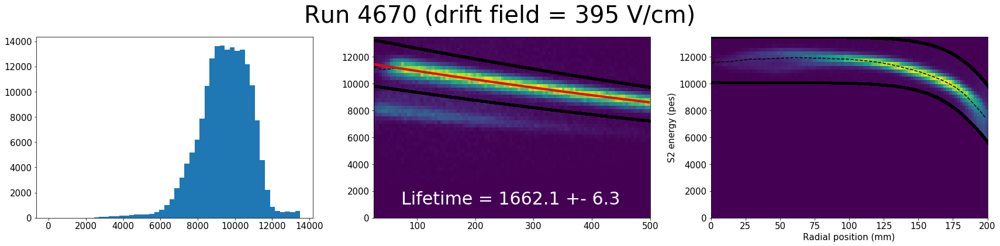

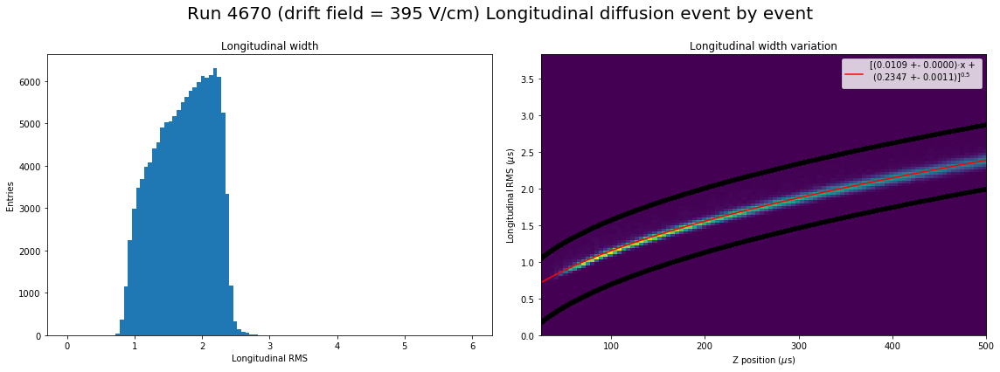

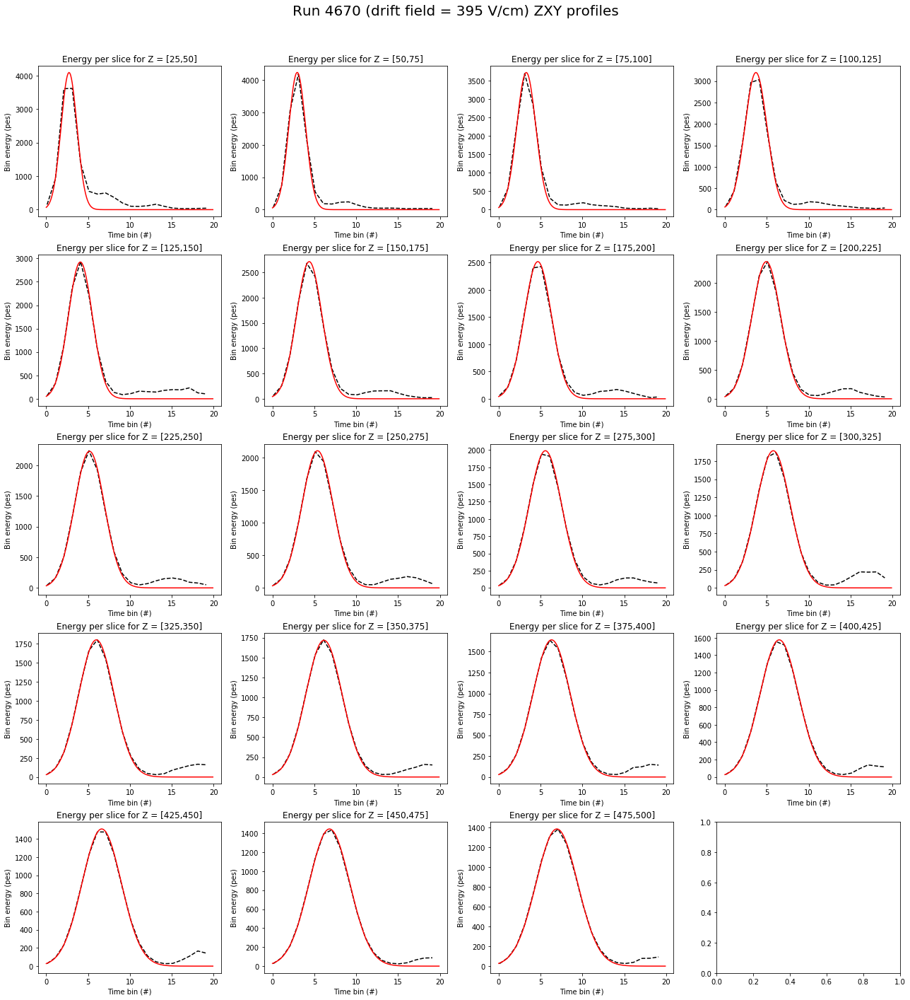

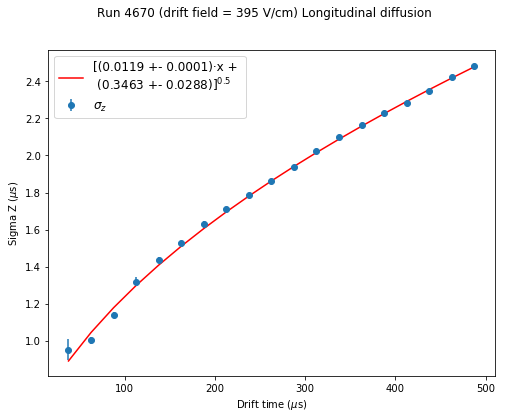

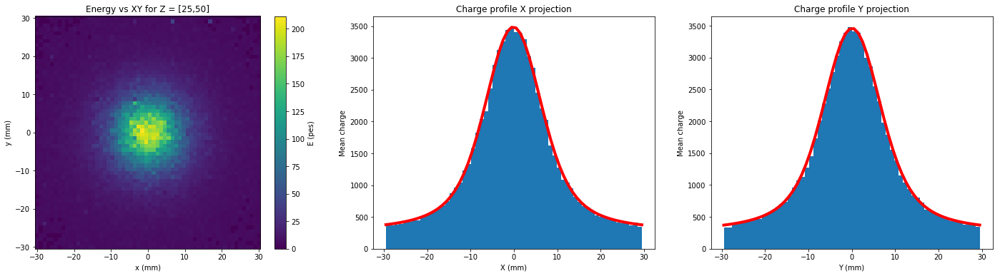

...

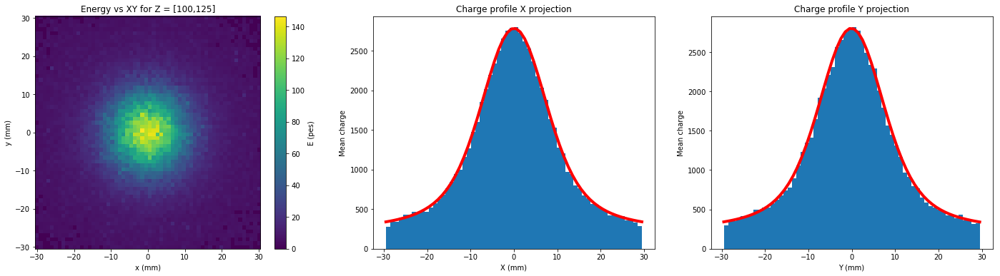

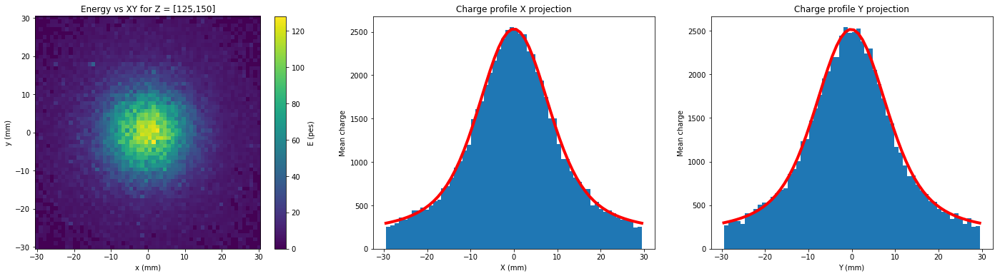

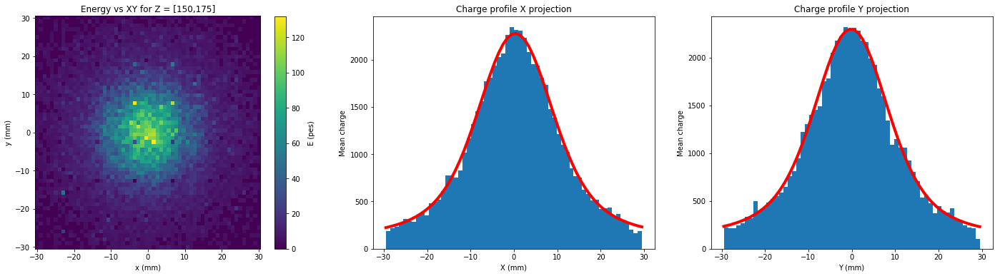

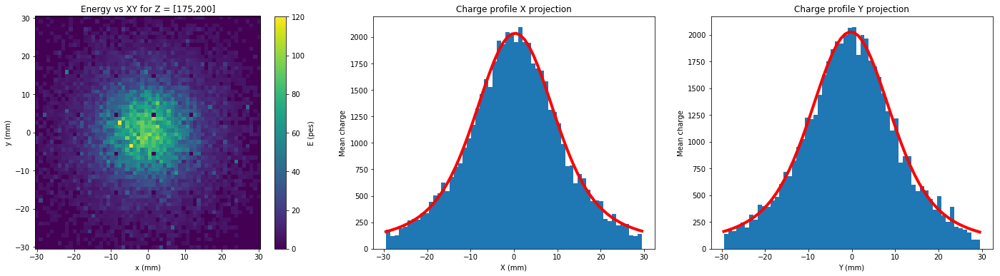

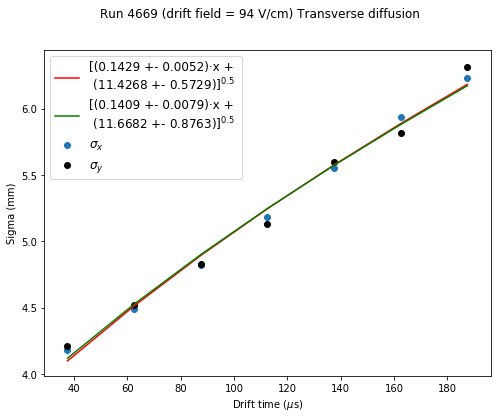

In [19]:
diffT_prof = {}
constT_prof = {}

diffL_prof = {}
constL_prof = {}

diffL_evt = {}
constL_evt = {}

lTime = {}

for run in run_numbers:
    
    #Longitudinal diffusion event by event (std) and checks
    inputfiles = glob.glob("/Users/ansimez/Documents/InvCit/hdf5/{0}/sipm_dst/sipm_dst_SiPM_xyzDiff_{0}.h5".format(run)) 
    mapDST = dstio.load_dsts(inputfiles, "Sensor_DST", "SiPM Map")
    R = np.sqrt(mapDST.X**2 + mapDST.Y**2)        
    print("Run {0} (drift field = {1:.0f} V/cm)\n".format(run,drift_fields[run]))

    fig, axes = plt.subplots(1, 3, figsize=(24,6))
    lTime[run], ZCorr = checkLifetime(mapDST, R, elimZ_min[run], elimZ_max[run], slope_min[run], slope_max[run], zrange[run], axes)
    low_cut, high_cut = radialCuts(elimR_min[run], elimR_max[run], R, axes, fPlot = True)
    st = fig.suptitle("Run {0} (drift field = {1:.0f} V/cm)".format(run,drift_fields[run]), fontsize = 40)
    fig.tight_layout()    
    st.set_y(0.98)
    fig.subplots_adjust(top=0.85)

    print("**** Longitudinal diffusion, event by event")
    sel = R<150.    
    low_cut, high_cut = radialCuts(elimR_min[run], elimR_max[run], R[sel], axes, fPlot = False)    
    diffL_evt[run], constL_evt[run] = longitudinalEvent(mapDST[sel], sigmaLim[run], diffLim[run], \
                                                        dv = dv[run], dv_e = dv_e[run], zrange = zrange[run])   
    
    #Diffusion with profiles (longitudinal)
    print("**** Longitudinal diffusion, profile")
    inputfiles = glob.glob("/Users/ansimez/Documents/InvCit/hdf5/{0}/sipm_dst/sipm_dst_SiPM_lbin_{0}.h5".format(run))
    mapDST = dstio.load_dsts(inputfiles, "Sensor_DST", "SiPM Map")
    R = np.sqrt(mapDST.X**2 + mapDST.Y**2)    
    sel = R<150.    
    low_cut, high_cut = radialCuts(elimR_min[run], elimR_max[run], R[sel], axes, fPlot = False)
    sigmaZ = longitudinalProfile(mapDST[sel], step = 25, z_int = 25, zrange = zrange[run])   
    diffL_prof[run], constL_prof[run] = longDiffusionFit(sigmaZ, zrange[run], 25., dv = dv[run], dv_e = dv_e[run])    
    
    #Diffusion with profiles (transversal)
    print("**** Transversal diffusion, profile")
    inputfiles = glob.glob("/Users/ansimez/Documents/InvCit/hdf5/{0}/sipm_dst/sipm_dst_SiPM_{0}.h5".format(run))
    mapDST = dstio.load_dsts(inputfiles, "Sensor_DST", "SiPM Map")
    R = np.sqrt(mapDST.X**2 + mapDST.Y**2)
    sel = R<150.    
    low_cut, high_cut = radialCuts(elimR_min[run], elimR_max[run], R[sel], axes, fPlot = False)
    sigmaAll, constantAll = transversalProfile(dbf.DataSiPM(run), mapDST[sel], step = 25, z_int = 25, zrange = zrange[run])   
    diffT_prof[run], constT_prof[run] = transDiffusionFit(sigmaAll, zrange[run], 25., dv = dv[run], dv_e = dv_e[run])    
    print("\n==========================================\n")

# Diffusion vs drift voltage

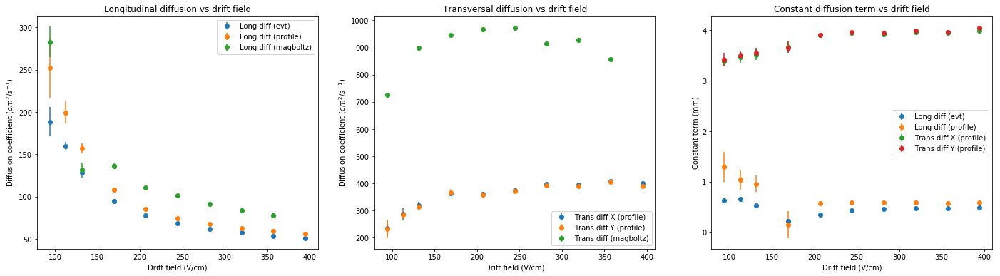

In [20]:
#magB errors are in % !!!

diffT_magB = {4660: [856, 3.01], 4661: [926.8, 2.82], 4663: [915.9, 2.92], 4664: [973.4, 3.02], \
              4665: [967.6, 1.99], 4666: [945.1, 3.38], 4667: [898.2, 8.05], 4669: [725.7, 8]}
#4668: [25, 275], 4670: [25, 500]}
diffL_magB = {4660: [78.33, 2.3], 4661: [83.61, 3.5], 4663: [91.43, 2.5], 4664: [101.4, 2.1], \
              4665: [110.9, 2.7], 4666: [136.4, 3.0], 4667: [131.4, 9.2], 4669: [282.6, 18]}
#4668: [25, 275], 4670: [25, 500]}
magList = sorted(diffL_magB.items())
runMag, magL = zip(*magList)
magList = sorted(diffT_magB.items())
runMag, magT = zip(*magList)

drift = [drift_fields[i] for i in runMag]
magL = np.array(magL)
magT = np.array(magT)


fig = plt.figure(figsize=(24,6))
ax1 = fig.add_subplot(131)
ax1.errorbar(list(drift_fields.values()), np.array(list(diffL_evt.values()))[:,0], yerr=np.array(list(diffL_evt.values()))[:,1], label="Long diff (evt)", fmt='o')
ax1.errorbar(list(drift_fields.values()), np.array(list(diffL_prof.values()))[:,0], yerr=np.array(list(diffL_prof.values()))[:,1], label="Long diff (profile)", fmt='o')
ax1.errorbar(drift, magL[:,0], yerr=magL[:,1], label="Long diff (magboltz)", fmt='o')
ax1.set_xlabel("Drift field (V/cm)")
ax1.set_ylabel("Diffusion coefficient ($cm^2$/$s^{-1}$)")
ax1.set_title("Longitudinal diffusion vs drift field")
ax1.legend()

ax2 = fig.add_subplot(132)
ax2.errorbar(list(drift_fields.values()), np.array(list(diffT_prof.values()))[:,0,0], yerr=np.array(list(diffT_prof.values()))[:,0,1], label="Trans diff X (profile)", fmt='o')
ax2.errorbar(list(drift_fields.values()), np.array(list(diffT_prof.values()))[:,1,0], yerr=np.array(list(diffT_prof.values()))[:,1,1], label="Trans diff Y (profile)", fmt='o')
ax2.errorbar(drift, magT[:,0], yerr=magT[:,1], label="Trans diff (magboltz)", fmt='o')
ax2.set_xlabel("Drift field (V/cm)")
ax2.set_ylabel("Diffusion coefficient ($cm^2$/$s^{-1}$)")
ax2.set_title("Transversal diffusion vs drift field")
ax2.legend()

ax3 = fig.add_subplot(133)
ax3.errorbar(list(drift_fields.values()), np.array(list(constL_evt.values()))[:,0], yerr=np.array(list(constL_evt.values()))[:,1], label="Long diff (evt)", fmt='o')
ax3.errorbar(list(drift_fields.values()), np.array(list(constL_prof.values()))[:,0], yerr=np.array(list(constL_prof.values()))[:,1], label="Long diff (profile)", fmt='o')
ax3.errorbar(list(drift_fields.values()), np.array(list(constT_prof.values()))[:,0,0], yerr=np.array(list(constT_prof.values()))[:,0,1], label="Trans diff X (profile)", fmt='o')
ax3.errorbar(list(drift_fields.values()), np.array(list(constT_prof.values()))[:,1,0], yerr=np.array(list(constT_prof.values()))[:,1,1], label="Trans diff Y (profile)", fmt='o')
ax3.legend()
ax3.set_xlabel("Drift field (V/cm)")
ax3.set_ylabel("Constant term (mm)")
ax3.set_title("Constant diffusion term vs drift field")



In [32]:
drift

[357.14285714285717,
 319.54887218045116,
 281.95488721804509,
 244.3609022556391,
 206.76691729323309,
 169.17293233082708,
 131.57894736842104,
 112.78195488721805,
 93.984962406015043,
 394.73684210526318]

# Lifetime vs drift voltage

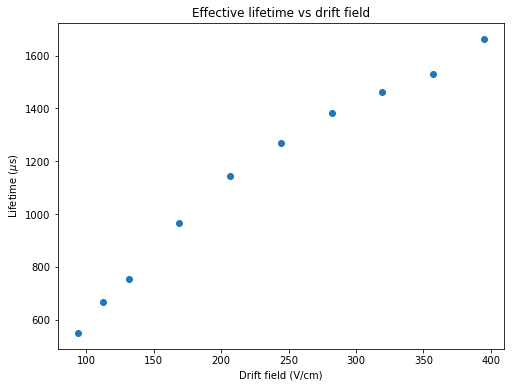

In [21]:
fig = plt.figure()
ax1 = fig.add_subplot(111)
ax1.errorbar(list(drift_fields.values()), np.array(list(lTime.values()))[:,0], yerr=np.array(list(lTime.values()))[:,1], label="Effective lifetime", fmt='o')
ax1.set_xlabel("Drift field (V/cm)")
ax1.set_ylabel("Lifetime ($\mu$s)")
ax1.set_title("Effective lifetime vs drift field")



# Resolution vs drift voltage

Run 4670 (drift field = 395 V/cm)

Resolution at 41.5 keV: 4.754 +- 0.032
Resolution at 2458 keV: 0.6177 +- 0.0042
Chi2                  : 180.172504518


Run 4660 (drift field = 357 V/cm)

Resolution at 41.5 keV: 4.791 +- 0.035
Resolution at 2458 keV: 0.6225 +- 0.0045
Chi2                  : 149.080260616


Run 4661 (drift field = 320 V/cm)

Resolution at 41.5 keV: 4.712 +- 0.032
Resolution at 2458 keV: 0.6123 +- 0.0041
Chi2                  : 199.937798059


Run 4663 (drift field = 282 V/cm)

Resolution at 41.5 keV: 4.773 +- 0.039
Resolution at 2458 keV: 0.6201 +- 0.0051
Chi2                  : 148.491395725


Run 4664 (drift field = 244 V/cm)

Resolution at 41.5 keV: 4.881 +- 0.035
Resolution at 2458 keV: 0.6343 +- 0.0046
Chi2                  : 107.164386431


Run 4665 (drift field = 207 V/cm)

Resolution at 41.5 keV: 4.954 +- 0.037
Resolution at 2458 keV: 0.6437 +- 0.0048
Chi2                  : 83.6586285292


Run 4666 (drift field = 169 V/cm)

Resolution at 41.5 keV: 5.030 +- 0.

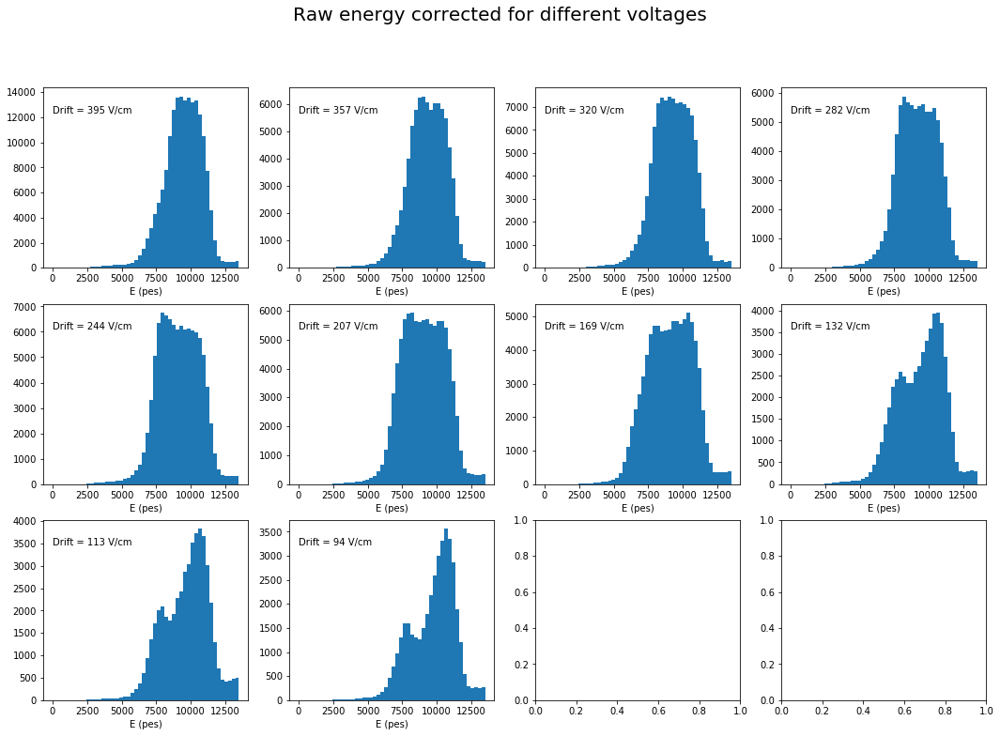

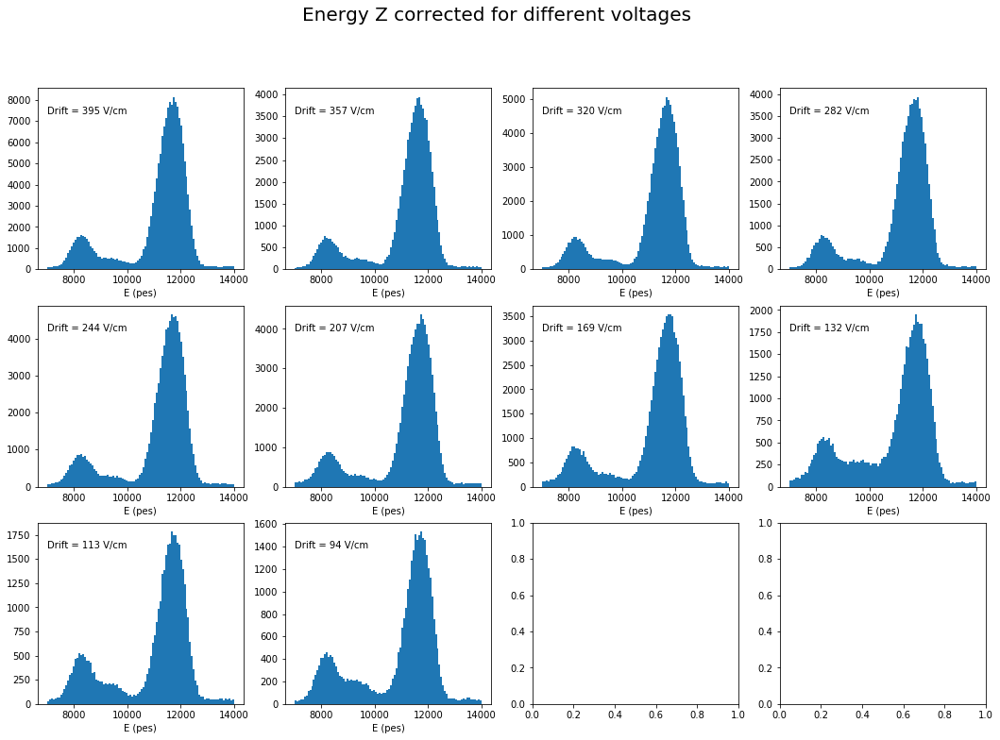

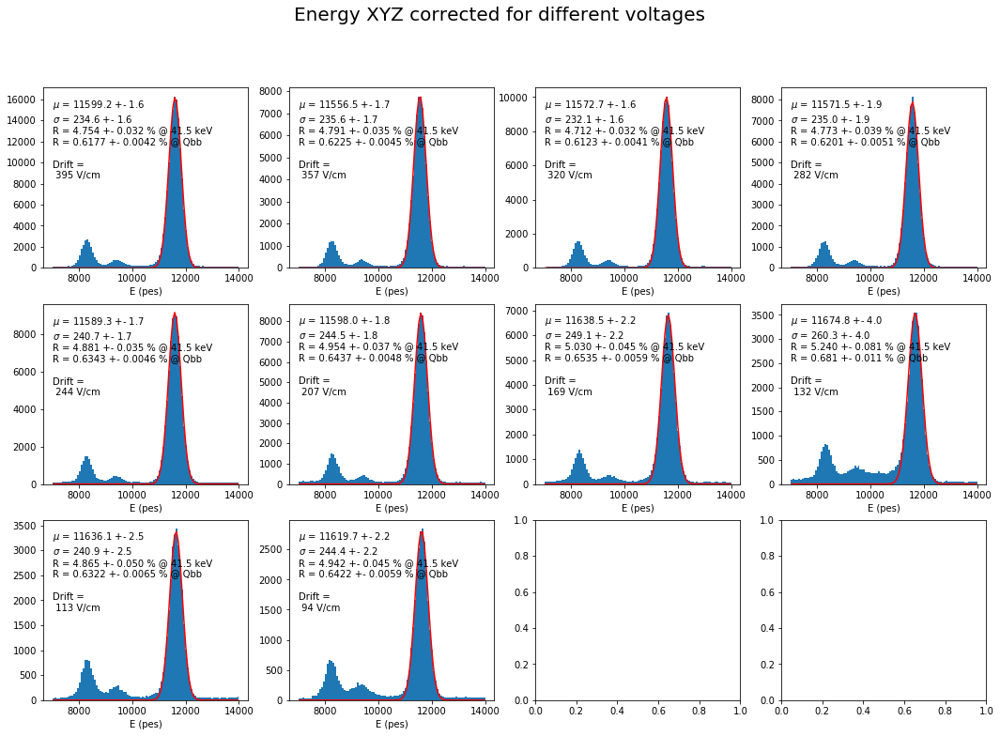

In [22]:
plt.rcParams["font.size"]               = 10

resoRange = {4660: [7000, 14000], 4661: [7000, 14000], 4663: [7000, 14000], 4664: [7000, 14000],
             4665: [7000, 14000] ,4666: [7000, 14000], 4667: [7000, 14000], 4668: [7000, 14000], 
             4669: [7000, 14000], 4670: [7000, 14000]}

fitRange = {4660: [11000, 12500], 4661: [11000, 12500], 4663: [11000, 12500], 4664: [11000, 12500],
            4665: [11000, 12500] ,4666: [11000, 12500], 4667: [11000, 12500], 4668: [11000, 12500], 
            4669: [11000, 12500], 4670: [11000, 12500]}

n_row = 4
nrows = len(run_numbers)//n_row

if len(run_numbers)%n_row>0:
    nrows +=1
        
fig, axes = plt.subplots(nrows, n_row, figsize=(18, 4*nrows))
st = fig.suptitle("Raw energy corrected for different voltages".format(run,drift_fields[run]), \
                  fontsize = 20)

fig2, axes2 = plt.subplots(nrows, n_row, figsize=(18, 4*nrows))
st = fig2.suptitle("Energy Z corrected for different voltages".format(run,drift_fields[run]), \
                  fontsize = 20)
fig3, axes3 = plt.subplots(nrows, n_row, figsize=(18, 4*nrows))
st = fig3.suptitle("Energy XYZ corrected for different voltages".format(run,drift_fields[run]), \
                  fontsize = 20)

eReso = {}
eResoQbb = {}

XYCorr = dstf.load_xy_corrections("/Users/ansimez/Documents/InvCit/ICARO/icaro/NB_Ander/Diffusion/run4628_corrections_5.3mm.h5")

for i, run in enumerate(run_numbers):
    inputfiles = glob.glob("/Users/ansimez/Documents/InvCit/hdf5/{0}/sipm_dst/sipm_dst_SiPM_xyzDiff_{0}.h5".format(run)) 
    mapDST = dstio.load_dsts(inputfiles, "Sensor_DST", "SiPM Map")
    print("Run {0} (drift field = {1:.0f} V/cm)\n".format(run,drift_fields[run]))

    ZCorr = corrf.LifetimeCorrection(lTime[run][0], lTime[run][1])
    EC_Zcorr = mapDST.EC * ZCorr(mapDST.Z.values).value
    EC_corr = EC_Zcorr * XYCorr(mapDST.X.values, mapDST.Y.values).value

    R = np.sqrt(mapDST.X**2 + mapDST.Y**2)     
    sel = R<150.

    plt.figure(fig.number)
    plt.axes(axes[i//n_row][i%n_row])
    yf, xf, _ =     hist(mapDST.EC[sel], 50, erange, new_figure=False)
    labels("E (pes)", "", "")
    plt.text(0., 0.9*yf.max(), "Drift = {0:.0f} V/cm".format(drift_fields[run]))
    
    plt.figure(fig2.number)
    plt.axes(axes2[i//n_row][i%n_row])
    yf, xf, _ = hist(EC_Zcorr[sel], 100, resoRange[run], new_figure=False)
    labels("E (pes)", "", "")
    plt.text(resoRange[run][0], 0.9*yf.max(), "Drift = {0:.0f} V/cm".format(drift_fields[run]))
    
    plt.figure(fig3.number)
    plt.axes(axes3[i//n_row][i%n_row])
    yf, xf, _ = hist(EC_corr[sel], 100, resoRange[run], new_figure=False)
    labels("E (pes)", "", "")

    seed = (yf.max(), xf.mean(), xf.std())
    f    = fitf.fit(fitf.gauss, xf, yf, seed, fit_range=fitRange[run])

    eReso[run] = [resolution(f.values, f.errors, 41.5)[0][0], resolution(f.values, f.errors, 41.5)[0][1]]
    eResoQbb[run] = [resolution(f.values, f.errors, 41.5)[1][0], resolution(f.values, f.errors, 41.5)[0][1]]
    
    print("Resolution at 41.5 keV:", measurement_string(*resolution(f.values, f.errors, 41.5)[0]))
    print("Resolution at 2458 keV:", measurement_string(*resolution(f.values, f.errors, 41.5)[1]))
    print("Chi2                  :", f.chi2)
    print("\n===============================\n")    
    plt.plot(xf, f.fn(xf), fitOpt)
    plt.text(resoRange[run][0], 0.72*yf.max(), gausstext(f.values, f.errors, 41.5))
    plt.text(resoRange[run][0], 0.52*yf.max(), "Drift = \n {0:.0f} V/cm".format(drift_fields[run]))

(0.51974832740521704, 0.77962249110782555)

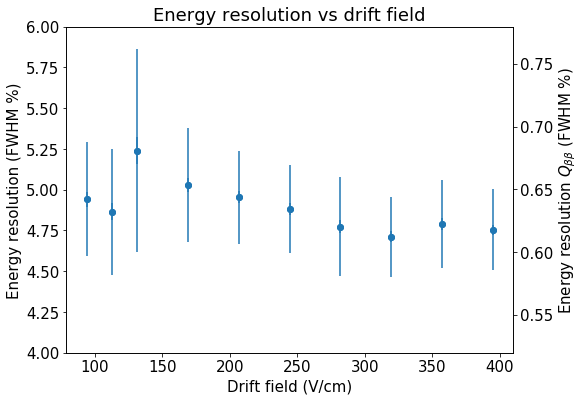

In [23]:
plt.rcParams["font.size"]               = 15

fig = plt.figure()
ax1 = fig.add_subplot(111)

ax1.errorbar(list(drift_fields.values()), np.array(list(eReso.values()))[:,0], yerr=np.array(list(eReso.values()))[:,1], label="Effective lifetime", fmt='o')
ax1.set_title("Energy resolution vs drift field")
ax1.set_xlabel("Drift field (V/cm)")
ax1.set_ylabel("Energy resolution (FWHM %)")
ax1.set_ylim(4., 6.)

ax2 = ax1.twinx()
ax2.errorbar(list(drift_fields.values()), np.array(list(eResoQbb.values()))[:,0], yerr=np.array(list(eResoQbb.values()))[:,1], label="Effective lifetime", fmt='o')
ax2.set_ylabel("Energy resolution $Q_{\\beta\\beta}$ (FWHM %)")
ax2.set_ylim(4.*np.sqrt(41.5/2458), 6.*np.sqrt(41.5/2458))
